In [1]:
import yaml
import xarray as xr
from source.mass_balance_functions import mass_fraction
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from dataclasses import dataclass

with open("config.yaml", "r") as f:
    CONFIG = yaml.safe_load(f)

In [2]:
"""
Arctic Polar Stereographic Map — Three Panel pcolormesh
========================================================
Plots three xarray DataArrays side by side on a North Polar
Stereographic projection using Cartopy and pcolormesh.

Requirements:
    pip install cartopy matplotlib xarray numpy

Usage:
    - Replace the dummy DataArrays in the LOAD YOUR DATA section
      with your own xarray DataArrays.
    - Each DataArray must have 'lat' and 'lon' dimensions/coords.
    - Edit PANELS to set titles, colormaps, and value ranges.
    - Run:  python arctic_three_panel.py
"""

# =============================================================================
# HELPER — circular boundary
# =============================================================================

def add_circular_boundary(ax):
    theta = np.linspace(0, 2 * np.pi, 300)
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * 0.5 + 0.5)
    ax.set_boundary(circle, transform=ax.transAxes)


# =============================================================================
# PLOTTING
# =============================================================================

def draw_panel(ax, panel):
    da        = panel["data"]
    cmap      = panel.get("cmap", "viridis")
    vmin      = panel.get("vmin", None)
    vmax      = panel.get("vmax", None)
    title     = panel.get("title", "")
    cbar_label = panel.get("cbar_label", "")

    transform = ccrs.PlateCarree()

    ax.set_extent([-180, 180, EXTENT_LATITUDE, 90], crs=transform)

    # --- Background features ---
    ax.add_feature(cfeature.NaturalEarthFeature(
        "physical", "ocean", MAP_RESOLUTION,
        facecolor="#C8DFED", edgecolor="none"
    ))
    ax.add_feature(cfeature.NaturalEarthFeature(
        "physical", "land", MAP_RESOLUTION,
        facecolor="#D6CFC0", edgecolor="#888888", linewidth=0.5
    ))
    ax.add_feature(cfeature.NaturalEarthFeature(
        "physical", "lakes", MAP_RESOLUTION,
        facecolor="#C8DFED", edgecolor="none"
    ))

    # --- Gridlines ---
    gl = ax.gridlines(
        crs=transform,
        linewidth=0.5,
        color="grey",
        alpha=0.5,
        linestyle="--",
        draw_labels=False,
    )

    # --- pcolormesh ---
    # Handle both 1-D and 2-D lat/lon coordinates
    lats = da["latitude"].values
    lons = da["longitude"].values

    if lats.ndim == 1 and lons.ndim == 1:
        lon2d, lat2d = np.meshgrid(lons, lats)
    else:
        lat2d, lon2d = lats, lons

    im = ax.pcolormesh(
        lon2d, lat2d, da.values,
        transform=transform,
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        shading="auto",
        zorder=3,
    )

    # --- Redraw land borders on top of data ---
    ax.add_feature(cfeature.NaturalEarthFeature(
        "physical", "land", MAP_RESOLUTION,
        facecolor="none", edgecolor="#555555", linewidth=0.6
    ), zorder=4)

    # --- Circular boundary ---
    add_circular_boundary(ax)

    # --- Colorbar ---
    cbar = plt.colorbar(im, ax=ax, orientation="horizontal",
                        pad=0.04, fraction=0.046, shrink=0.85)
    cbar.set_label(cbar_label, fontsize=9)
    cbar.ax.tick_params(labelsize=8)

    ax.set_title(title, fontsize=11, fontweight="bold", pad=10)


def draw_map():
    fig, axes = plt.subplots(
        1, 3,
        figsize=FIGSIZE,
        subplot_kw={"projection": PROJECTION},
    )

    for ax, panel in zip(axes, PANELS):
        draw_panel(ax, panel)

    fig.suptitle(SUPTITLE, fontsize=14, fontweight="bold", y=1.01)
    plt.tight_layout()

    if OUTPUT_FILE:
        plt.savefig(OUTPUT_FILE, dpi=DPI, bbox_inches="tight")
        print(f"Saved → {OUTPUT_FILE}")
    else:
        plt.show()

def find_dmw(extents, lat, lon, dmw_default=-21):
    """
    if a given lat,lon is within one of the extents then return the list of dmw values for that extent
    if the lat lon is not within any extent then return the default dmw value.
    The order of extents in the extents list denotes the priority as the first match is returned.
    """
    for extent in extents.values():
        lon_min, lon_max, lat_min, lat_max = extent["extent"]
        if lon_min <= lon <= lon_max and lat_min <= lat <= lat_max:
            return extent["dmw"]
    return dmw_default

In [3]:
# Load oyxgen isotope & salinity data
oxy_iso = xr.open_dataset(CONFIG["arctic_reanalysis_oxy"])
oxy_iso = oxy_iso["oxygen_isotope_tracer"]
sal = xr.open_dataset(CONFIG["arctic_reanalysis"])
sal = sal["so"]
# extract a single year
year = "1994" #"2007"
oxy_iso_subset = oxy_iso.sel(time=year)
sal_subset = sal.sel(time=year)
# convert to seasonal averages
oxy_iso_1year = oxy_iso_subset.groupby("time.season").mean("time")
sal_1year = sal_subset.groupby("time.season").mean("time")


In [4]:
# generate a varying DMW field based on freshwater O18 analsis in specific regions
# make an copy of oxy_iso but with 0's
dmw = xr.zeros_like(oxy_iso_1year)
# used for constant DMW extents for sensitvity analysis, see pan arctic extent
dmw_constant = -20
# each DMW value is ordered for each season DJF, MAM, JJA, SON 
# extent is ordered lon min, lon max, lat min, lat max
extents = {
#     "East_Siberian_Sea": {"extent":[70, 180, 60, 80],
#                     "dmw": [-22.54,-19.48,-17.28,-20.23]
#                    },
#     "Canadian Archipelago": {"extent":[-120, -75, 60, 85],
#                     "dmw": [-28.12,-26.30,-18.57,-23.11]
#                    },
#     "Beaufort Sea": {"extent":[-180, -120, 60, 80], 
#                     "dmw": [-21.29,-20.58,-18.23,-18.55]
#                    },
#     "Greenland1": {"extent":[-75, -7, 75, 85],
#                     "dmw":[-38.20,-33.54,-28.13,-35.25]
#                    },
#     "Greenland2": {"extent":[-57.5, -18, 68, 75],
#                     "dmw": [-38.20,-12,-28.13,-35.25]
#                    },
#     "Greenland3": {"extent":[-58, -32, 60, 68],
#                     "dmw": [-38.20,-31.1,-28.13,-35.25]
#                    },
#     "Iceland": {"extent":[-25, -12, 62, 67],
#                     "dmw": [-9.13,-7.55,-7.68,-8.63]
#                    },
#     "Svalbard": {"extent":[5, 35, 76, 81],
#                     "dmw": [-11.36,-11.32,-11.16,-11.14]
#                    },    
#     "Barents_Sea": {"extent":[-7, 70, 60, 85],
#                     "dmw": [-14.26,-12.59,-10.91,-12.72]
#                    },
    "Pan Arctic": {"extent":[-180, 180, 60, 90],
                    "dmw": [dmw_constant,dmw_constant,dmw_constant,dmw_constant]
                   },
}

# Build 2D meshgrid of lat/lon once
lons = dmw["longitude"].values
lats = dmw["latitude"].values
print(lats.__len__())
print(lons.__len__())
for i in range(lats.__len__()):
    for j in range(lons.__len__()):
        val = find_dmw(extents,lats[i],lons[j])
        dmw[:, :, i, j] = np.array(val).flatten()[:, np.newaxis]
        

321
2880


In [5]:
# Plot Config Class, allows the overiding of parameters such as colour map limits.
@dataclass
class PlotConfig:
    depth: int
    season: str
    fsw_cmap_min: float = 0.75
    fsw_cmap_max: float = 1.0
    fmw_cmap_min: float = 0.0
    fmw_cmap_max: float = 0.3
    fsi_cmap_min: float = -0.1
    fsi_cmap_max: float = 0.2
    
# create a configuration for every plot I want to output. e.g. each depth and season.
plot_configs = [
                PlotConfig(depth=2,season='DJF'),
                PlotConfig(depth=2,season='MAM'),
                PlotConfig(depth=2,season='JJA'),
                PlotConfig(depth=2,season='SON'),
                PlotConfig(depth=10,season='DJF',fsi_cmap_max=0.1),
                PlotConfig(depth=10,season='MAM',fsi_cmap_max=0.1),
                PlotConfig(depth=10,season='JJA',fsi_cmap_max=0.1),
                PlotConfig(depth=10,season='SON',fsi_cmap_max=0.1),
                PlotConfig(depth=50,season='DJF',fsw_cmap_min=0.9,fmw_cmap_max=0.2,fsi_cmap_max=0.01),
                PlotConfig(depth=50,season='MAM',fsw_cmap_min=0.9,fmw_cmap_max=0.2,fsi_cmap_max=0.01),
                PlotConfig(depth=50,season='JJA',fsw_cmap_min=0.9,fmw_cmap_max=0.2,fsi_cmap_max=0.01),
                PlotConfig(depth=50,season='SON',fsw_cmap_min=0.9,fmw_cmap_max=0.2,fsi_cmap_max=0.01),
                PlotConfig(depth=100,season='DJF',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
                PlotConfig(depth=100,season='MAM',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
                PlotConfig(depth=100,season='JJA',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
                PlotConfig(depth=100,season='SON',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
                PlotConfig(depth=200,season='DJF',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
                PlotConfig(depth=200,season='MAM',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
                PlotConfig(depth=200,season='JJA',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
                PlotConfig(depth=200,season='SON',fsw_cmap_min=0.9,fmw_cmap_max=0.1,fsi_cmap_max=0.01),
               ]

Saved → mass_plots/AWS_1994_DJF_2m_-20.png
Saved → mass_plots/AWS_1994_MAM_2m_-20.png
Saved → mass_plots/AWS_1994_JJA_2m_-20.png
Saved → mass_plots/AWS_1994_SON_2m_-20.png
Saved → mass_plots/AWS_1994_DJF_10m_-20.png
Saved → mass_plots/AWS_1994_MAM_10m_-20.png
Saved → mass_plots/AWS_1994_JJA_10m_-20.png
Saved → mass_plots/AWS_1994_SON_10m_-20.png
Saved → mass_plots/AWS_1994_DJF_50m_-20.png
Saved → mass_plots/AWS_1994_MAM_50m_-20.png
Saved → mass_plots/AWS_1994_JJA_50m_-20.png
Saved → mass_plots/AWS_1994_SON_50m_-20.png
Saved → mass_plots/AWS_1994_DJF_100m_-20.png
Saved → mass_plots/AWS_1994_MAM_100m_-20.png
Saved → mass_plots/AWS_1994_JJA_100m_-20.png
Saved → mass_plots/AWS_1994_SON_100m_-20.png
Saved → mass_plots/AWS_1994_DJF_200m_-20.png
Saved → mass_plots/AWS_1994_MAM_200m_-20.png
Saved → mass_plots/AWS_1994_JJA_200m_-20.png
Saved → mass_plots/AWS_1994_SON_200m_-20.png


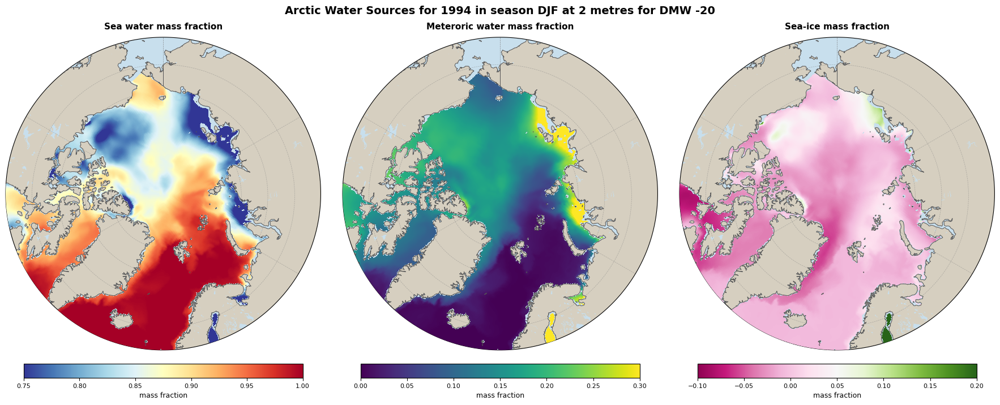

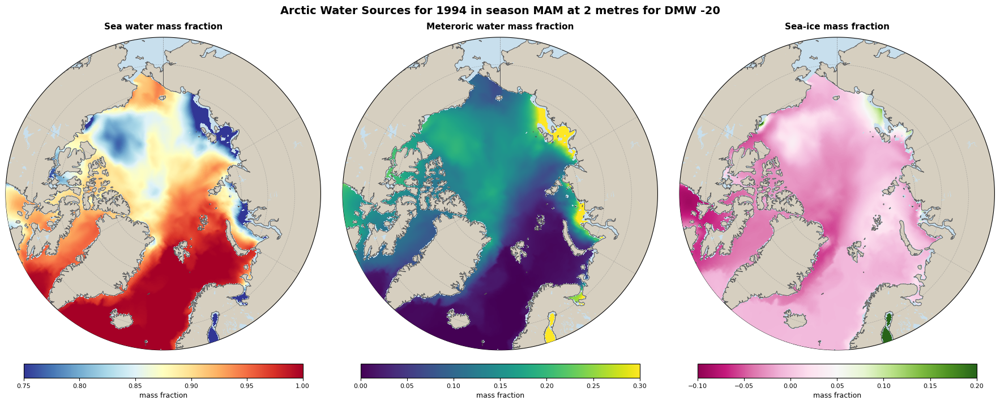

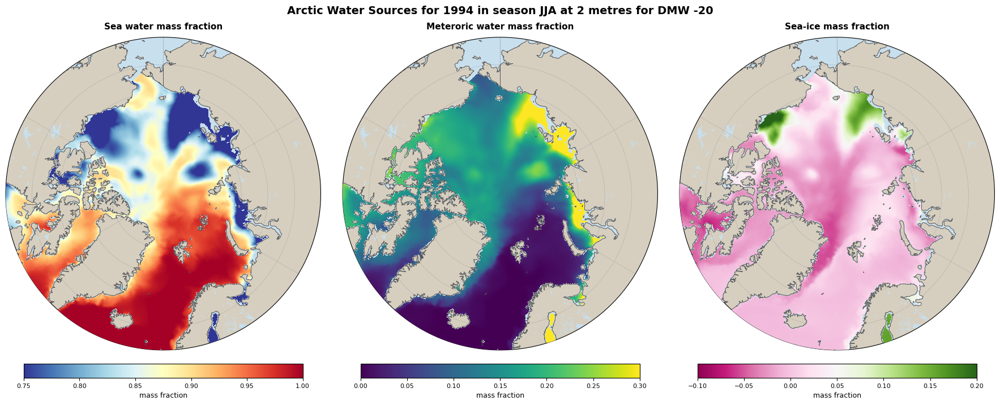

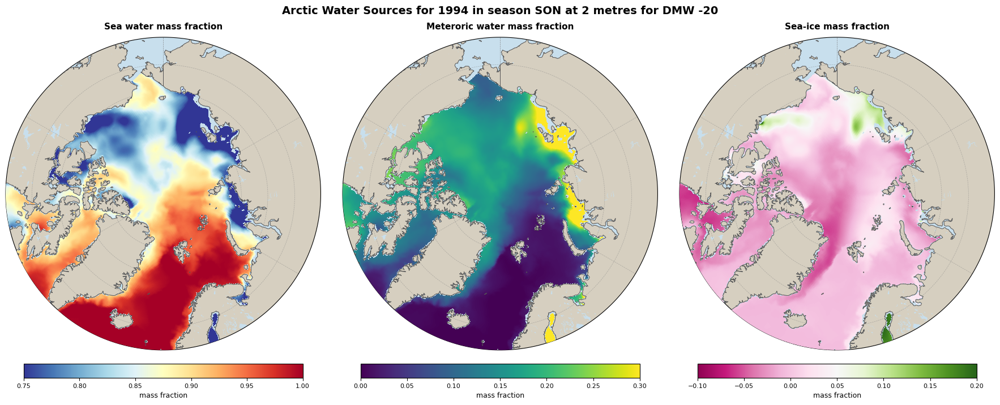

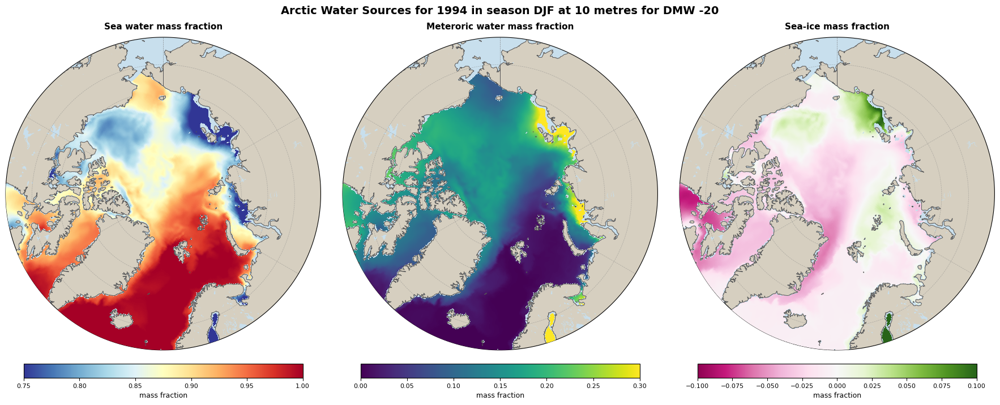

...

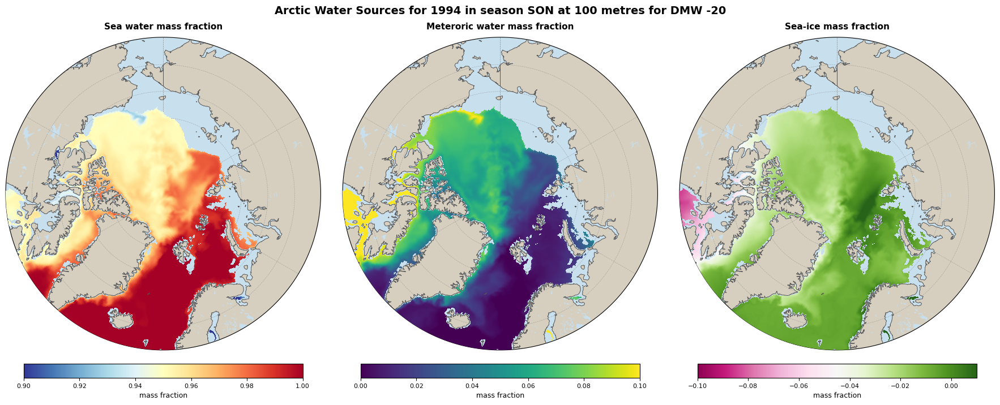

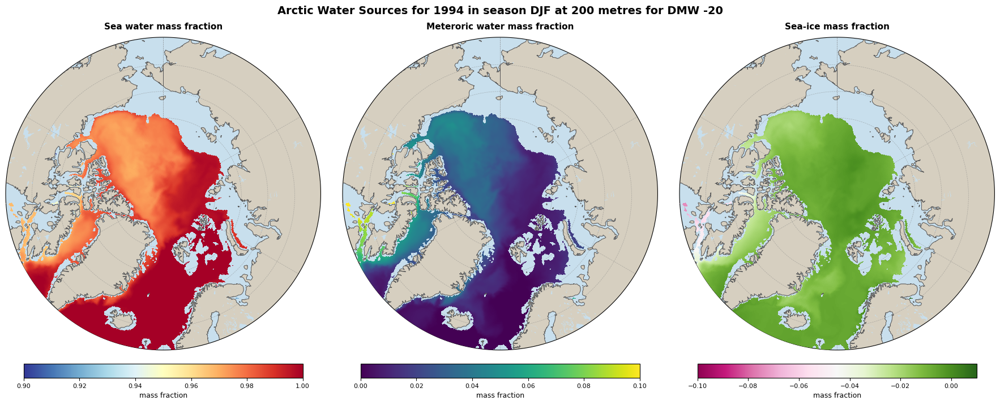

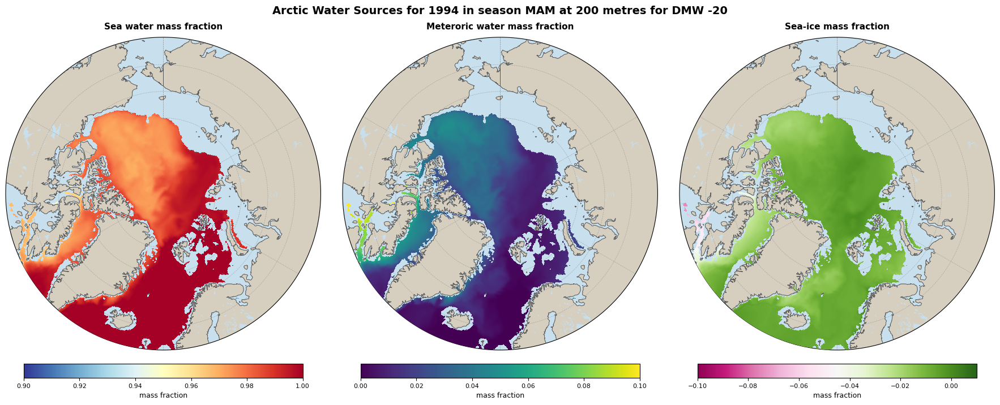

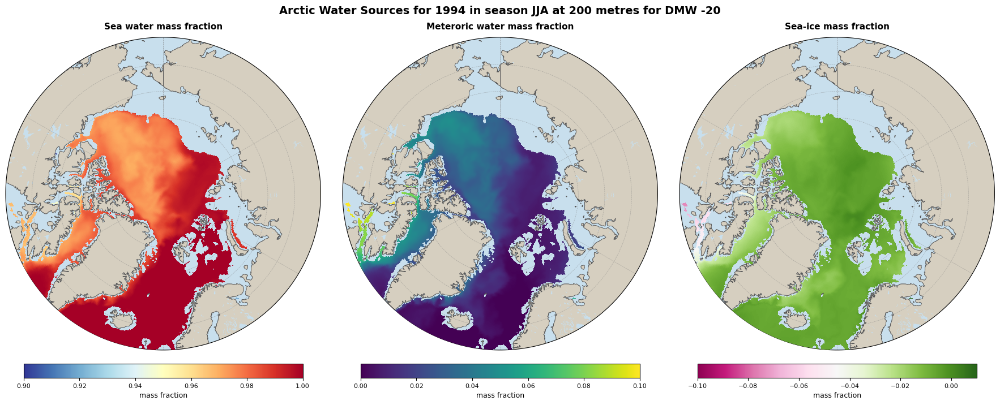

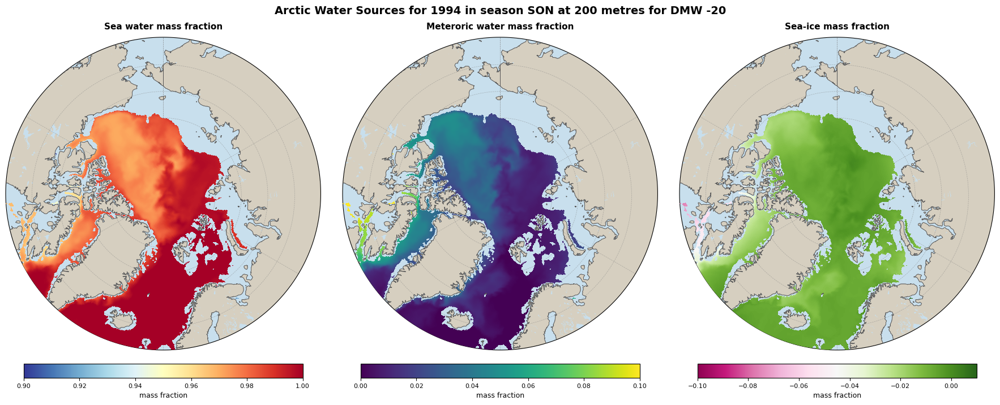

In [6]:
# produce a plot for each plot config
for pc in plot_configs:
    # # Compute the fractions relating to sea water, meteoric water & sea-ice
    fsw,fmw,fsi = mass_fraction(oxy_iso=oxy_iso_1year.sel(depth=pc.depth, method='nearest').sel(season=pc.season), 
                                sal=sal_1year.sel(depth=pc.depth, method='nearest').sel(season=pc.season),
                                dmw=dmw.sel(depth=pc.depth, method='nearest').sel(season=pc.season))
    
    
    # =============================================================================
    # PANEL CONFIGURATION
    # Each entry corresponds to one DataArray. Edit titles, cmaps, and vmin/vmax.
    # Set vmin/vmax to None to auto-scale.
    # =============================================================================
    
    PANELS = [
        {
            "data":      fsw,
            "title":     "Sea water mass fraction",
            "cmap":      "RdYlBu_r",
            "vmin":      pc.fsw_cmap_min,
            "vmax":      pc.fsw_cmap_max,
            "cbar_label": "mass fraction",
        },
        {
            "data":      fmw,
            "title":     "Meteroric water mass fraction",
            "cmap":      "viridis",
            "vmin":      pc.fmw_cmap_min,
            "vmax":      pc.fmw_cmap_max,
            "cbar_label": "mass fraction",
        },
        {
            "data":      fsi,
            "title":     "Sea-ice mass fraction",
            "cmap":      "PiYG",
            "vmin":      pc.fsi_cmap_min,
            "vmax":      pc.fsi_cmap_max,
            "cbar_label": "mass fraction",
        },
    ]
    
    # =============================================================================
    # MAP SETTINGS
    # =============================================================================
    
    PROJECTION      = ccrs.NorthPolarStereo()
    EXTENT_LATITUDE = 60          # show everything north of this latitude
    MAP_RESOLUTION  = "50m"       # "10m", "50m", or "110m"
    FIGSIZE         = (18, 7)
    #SUPTITLE        = f"Arctic Water Sources for {year} in season {pc.season} at {pc.depth} metres"
    # for constant dmw values
    SUPTITLE        = f"Arctic Water Sources for {year} in season {pc.season} at {pc.depth} metres for DMW {dmw_constant}"
    #OUTPUT_FILE     = f"mass_plots/AWS_{year}_{pc.season}_{pc.depth}m.png"   # set to None to display interactively
    # for constant dmw values
    OUTPUT_FILE     = f"mass_plots/AWS_{year}_{pc.season}_{pc.depth}m_{dmw_constant}.png"   # set to None to display interactively
    DPI             = 200
    
    draw_map()